In [2]:
from NLProcess import *
PATH = Path('data/tweets/')

# Topic Modeling

## Gather Data

In [13]:
texts, users = collate_files(PATH)

In [7]:
col_names = ['user','text']

In [80]:
df_texts = pd.DataFrame({'text':texts, 'user':users}, columns=col_names)

In [81]:
df_texts.head()

,user,text
0,RepJoseSerrano,"With Criollitos de Venezuela, winners of baseb..."
1,govkristinoem,Thank you for stopping in for coffee!
2,RepDonaldPayne,We need to have an honest && meaningful discus...
3,SteveDaines,Excellent briefing from @DeptofDefense Sec Mat...
4,RepCummings,RT @OversightDems: .@RepCummings: Neffenger st...


In [88]:
len(set(users))

592

In [ ]:
df_texts = sentimental(df_texts)

## Explore Sentiment

In [101]:
df_texts['sentiment'].describe()

count    1.839842e+06
mean     2.228847e-01
std      4.645603e-01
min     -9.890000e-01
25%      0.000000e+00
50%      2.732000e-01
75%      6.249000e-01
max      9.929000e-01
Name: sentiment, dtype: float64

In [117]:
df_texts.iloc[df_texts['sentiment'].idxmin()]

user                                             SenRubioPress
text         Fernando Albán’s tragic death is yet another r...
sentiment                                               -0.989
embedding    [-0.034669943, 0.09076082, 0.009009021, 0.0649...
Name: 59662, dtype: object

In [113]:
df_texts.iloc[df_texts['sentiment'].idxmin()]['text']

'Fernando Albán’s tragic death is yet another reminder of the danger political prisoners in #Venezuela face every day. While the Maduro regime called his death as a suicide, Albán’s fellow prisoners and members of the opposition are calling this a vile murder.'

In [115]:
df_texts.iloc[df_texts['sentiment'].idxmax()]

user                                            RepHankJohnson
text         “And love is love is love is love is love is l...
sentiment                                               0.9929
embedding    [-0.044950467, 0.22405188, -0.062625766, 0.000...
Name: 750928, dtype: object

In [114]:
df_texts.iloc[df_texts['sentiment'].idxmax()]['text']

'“And love is love is love is love is love is love is love is love cannot be killed or swept aside” -- .@lin_manuel. Proud to have earned a 100 on .@HRC congressional scorecard for my support for the #LGBTQ community! '

## Latent Dirichlet Allocation
Steps performed as outlined by the guide at Machine Learning Plus found at:
https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/

In [ ]:
model_list, coherence_values, corpus, id2word = model_topics(df_texts)

In [ ]:
graph_coherence(coherence_values)

In [ ]:
top_model = model_list[4]
print(coherence_values[4])

In [197]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(top_model, corpus, id2word)
vis

/anaconda3/lib/python3.7/site-packages/joblib/externals/loky/process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
/anaconda3/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
21     0.161285  0.124178       1        1  6.833960
24     0.144930 -0.052915       2        1  6.755353
15    -0.073804  0.098992       3        1  6.682581
11    -0.258915 -0.059303       4        1  6.253641
12    -0.158088  0.131809       5        1  5.396085
10    -0.039285 -0.268914       6        1  4.586468
3     -0.206961 -0.035197       7        1  4.480572
2      0.132800  0.069690       8        1  4.077482
16     0.048460  0.118236       9        1  4.021715
8      0.116457 -0.020127      10        1  3.783990
0     -0.053537  0.060258      11        1  3.756450
17     0.116669 -0.052729      12        1  3.739653
9     -0.225637  0.051837      13        1  3.547682
13     0.034573 -0.155475      14        1  3.535209
6      0.106903  0.103482      15        1  3.449303
19    -0.005937 -0.268359      16        1  3.361087
5      0.100158 -0.024595      17        1  3.201983
7      0.101928 -0.021191      18        1  3.101982
14    -0.002688  0.098703      19        1  2.982960
20    -0.151933  0.119780      20        1  2.910663
1      0.122766  0.037730      21        1  2.872161
23     0.141249  0.047061      22        1  2.799638
4     -0.002645 -0.112663      23        1  2.711767
22    -0.168454  0.026291      24        1  2.610732
18     0.019707 -0.016579      25        1  2.546874, topic_info=     Category           Freq           Term          Total  loglift  logprob
term                                                                        
39    Default  353213.000000             rt  353213.000000  30.0000  30.0000
58    Default   61690.000000         health   61690.000000  29.0000  29.0000
114   Default   90404.000000           bill   90404.000000  28.0000  28.0000
107   Default   72503.000000          house   72503.000000  27.0000  27.0000
74    Default   50175.000000           care   50175.000000  26.0000  26.0000
404   Default   62898.000000            job   62898.000000  25.0000  25.0000
1096  Default   40011.000000          happy   40011.000000  24.0000  24.0000
364   Default   54000.000000          honor   54000.000000  23.0000  23.0000
209   Default  103070.000000          great  103070.000000  22.0000  22.0000
97    Default   39041.000000          right   39041.000000  21.0000  21.0000
158   Default   42001.000000          watch   42001.000000  20.0000  20.0000
157   Default   43192.000000            tax   43192.000000  19.0000  19.0000
382   Default   51900.000000          woman   51900.000000  18.0000  18.0000
130   Default   55935.000000           vote   55935.000000  17.0000  17.0000
11    Default  130160.000000          thank  130160.000000  16.0000  16.0000
650   Default   36156.000000         office   36156.000000  15.0000  15.0000
256   Default   50054.000000           pass   50054.000000  14.0000  14.0000
80    Default   80989.000000         family   80989.000000  13.0000  13.0000
215   Default   48662.000000           live   48662.000000  12.0000  12.0000
76    Default   44491.000000         senate   44491.000000  11.0000  11.0000
137   Default   78017.000000           make   78017.000000  10.0000  10.0000
77    Default   23521.000000      statement   23521.000000   9.0000   9.0000
187   Default   57368.000000      president   57368.000000   8.0000   8.0000
240   Default   42744.000000        student   42744.000000   7.0000   7.0000
473   Default   49381.000000        discuss   49381.000000   6.0000   6.0000
174   Default   26372.000000      obamacare   26372.000000   5.0000   5.0000
1022  Default   27171.000000        meeting   27171.000000   4.0000   4.0000
740   Default   70554.000000           year   70554.000000   3.0000   3.0000
416   Default   40250.000000        veteran   40250.000000   2.0000   2.0000
420   Default   24339.000000           tune   24339.000000   1.0000   1.0000
...       ...            ...            ...            ...    

In [30]:
model_topics = top_model.show_topics(formatted=False)
print(top_model.print_topics(num_words=10))

[(1,
  '0.024*"policy" + 0.018*"immigration" + 0.017*"child" + 0.016*"trade" + '
  '0.016*"family" + 0.016*"border" + 0.014*"trump" + 0.012*"immigrant" + '
  '0.011*"rt" + 0.011*"administration"'),
 (9,
  '0.021*"day" + 0.020*"congrat" + 0.019*"win" + 0.012*"congratulation" + '
  '0.012*"go" + 0.011*"today" + 0.010*"team" + 0.010*"great" + 0.009*"game" + '
  '0.008*"national"'),
 (6,
  '0.059*"health" + 0.027*"care" + 0.020*"aca" + 0.017*"insurance" + '
  '0.016*"coverage" + 0.016*"plan" + 0.013*"healthcare" + 0.012*"american" + '
  '0.011*"million" + 0.010*"trumpcare"'),
 (2,
  '0.041*"make" + 0.022*"need" + 0.016*"sure" + 0.015*"child" + 0.013*"water" '
  '+ 0.010*"get" + 0.009*"must" + 0.009*"rt" + 0.009*"kid" + 0.009*"epa"'),
 (0,
  '0.053*"job" + 0.020*"news" + 0.020*"energy" + 0.017*"rt" + 0.015*"create" + '
  '0.014*"economy" + 0.014*"new" + 0.013*"great" + 0.011*"good" + '
  '0.007*"company"'),
 (12,
  '0.038*"honor" + 0.025*"today" + 0.025*"service" + 0.024*"thank" + '
  '0.02

In [66]:
len(corpus)

1839842

In [78]:
sample_corpus, sample_data = zip(*random.sample(list(zip(corpus, df_texts.text.values.tolist())), 360000))

In [71]:
len(sample_data)

1839842

In [80]:
df_topic_sents_keywords = format_topics_sentences(corpus=sample_corpus, texts=sample_data)

0 rows done in 1.4197769165039062 seconds.
10000 rows done in 994.2861218452454 seconds.
20000 rows done in 1848.936840057373 seconds.
30000 rows done in 2554.1122879981995 seconds.
40000 rows done in 3248.5094277858734 seconds.
50000 rows done in 3944.624029159546 seconds.
60000 rows done in 4649.350461959839 seconds.
70000 rows done in 5349.1865670681 seconds.
80000 rows done in 6132.376891136169 seconds.
90000 rows done in 6998.27114200592 seconds.
100000 rows done in 7842.868110895157 seconds.
110000 rows done in 8903.508712768555 seconds.
120000 rows done in 9835.384542942047 seconds.
130000 rows done in 10754.530714988708 seconds.
140000 rows done in 11622.607710838318 seconds.
150000 rows done in 12728.904756784439 seconds.
160000 rows done in 13987.350237846375 seconds.
170000 rows done in 15005.802462816238 seconds.
180000 rows done in 15889.223049879074 seconds.
190000 rows done in 16985.341339111328 seconds.
200000 rows done in 18354.259955883026 seconds.
210000 rows done in

In [85]:
sent_topics_sorteddf = find_dominant_topic(df_topic_sents_keywords)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2.0,0.6477,"make, need, sure, child, water, get, must, rt,...",Now is the time to intensify the fight for our...
1,1,2.0,0.5113,"make, need, sure, child, water, get, must, rt,...",Great for CA water conservation-exceeded goals...
2,2,13.0,0.5001,"rt, look, forward, legislation, bipartisan, in...",Today I joined my colleagues on the House Cybe...
3,3,14.0,0.1965,"rt, world, america, get, word, build, well, ma...","Thanks to Brownfields Program, Tulsa has the B..."
4,4,24.0,0.7749,"bill, house, pass, vote, senate, act, republic...",W/ clock winding down toward a potential gover...
5,5,8.0,0.6800,"president, law, justice, sotu, trump, potus, m...",#FF @AshlyeV @winthropu
6,6,13.0,0.3508,"rt, look, forward, legislation, bipartisan, in...",Sunday marks the 50th anniversary of the Archi...
7,7,12.0,0.3510,"honor, today, service, thank, serve, veteran, ...",I’m grateful to my friend && colleague Rep. Bi...
8,8,12.0,0.4854,"honor, today, service, thank, serve, veteran, ...",RT @HouseGOP: Today we remember #DDay and give...
9,9,14.0,0.3597,"rt, world, america, get, word, build, well, ma...",RT @Ron_Nirenberg: The state does not have a m...


In [110]:
[print(keywords) for keywords in sent_topics_sorteddf.groupby('Topic_Num').head()['Keywords']]

job, news, energy, rt, create, economy, new, great, good, company
policy, immigration, child, trade, family, border, trump, immigrant, rt, administration
make, need, sure, child, water, get, must, rt, kid, epa
office, student, school, today, visit, staff, info, tomorrow, hour, rt
rt, woman, thank, work, pay, equal, man, housegop, support, time
right, rt, protect, vote, must, woman, fight, stand, today, internet
health, care, aca, insurance, coverage, plan, healthcare, american, million, trumpcare
statement, read, full, trump, president, secretary, syria, war, realdonaldtrump, administration
president, law, justice, sotu, trump, potus, must, hold, scotus, abuse
day, congrat, win, congratulation, go, today, team, great, game, national
watch, live, rt, tune, discuss, hear, join, hearing, today, talk
great, thank, today, meeting, meet, morning, discuss, visit, enjoy, talk
honor, today, service, thank, serve, veteran, day, woman, nation, country
rt, look, forward, legislation, bipartisan, i

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [84]:
topic_stats(df_topic_sents_keywords)

,Dominant_Topic,Topic_Keywords,Num_Documents,Perc_Documents
0,2.0,"make, need, sure, child, water, get, must, rt,...",12235.0,0.0340
1,2.0,"make, need, sure, child, water, get, must, rt,...",7681.0,0.0213
2,13.0,"rt, look, forward, legislation, bipartisan, in...",13426.0,0.0373
3,14.0,"rt, world, america, get, word, build, well, ma...",16714.0,0.0464
4,24.0,"bill, house, pass, vote, senate, act, republic...",8223.0,0.0228


In [187]:
group_topics(sent_topics_sorteddf)

,Dominant_Topic
0,
Civil Rights,0.0506
Community,0.1528
Defense,0.0458
Economy,0.1109
Environment,0.0373
Event,0.1849
Healthcare,0.0536
Immigration,0.0213
Legislation,0.1370


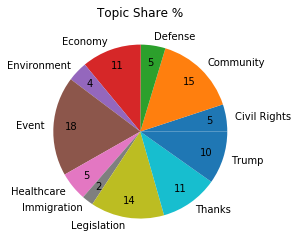

Civil Rights: rt, woman, thank, work, pay, equal, man, housegop, support, timeright, rt, protect, vote, must, woman, fight, stand, today, internet
Community: day, congrat, win, congratulation, go, today, team, great, game, nationalwork, help, community, support, program, business, local, today, center, thankfamily, must, thought, prayer, victim, people, attack, stand, keep, community
Defense: statement, read, full, trump, president, secretary, syria, war, realdonaldtrump, administrationstay, update, rt, israel, state, key, count, obama, important, safe
Economy: job, news, energy, rt, create, economy, new, great, good, companytax, american, cut, family, would, work, people, job, pay, worker
Environment: make, need, sure, child, water, get, must, rt, kid, epa
Event: office, student, school, today, visit, staff, info, tomorrow, hour, rtwatch, live, rt, tune, discuss, hear, join, hearing, today, talkgreat, thank, today, meeting, meet, morning, discuss, visit, enjoy, talk
Healthcare: health

[None, None, None, None, None, None, None, None, None, None, None]

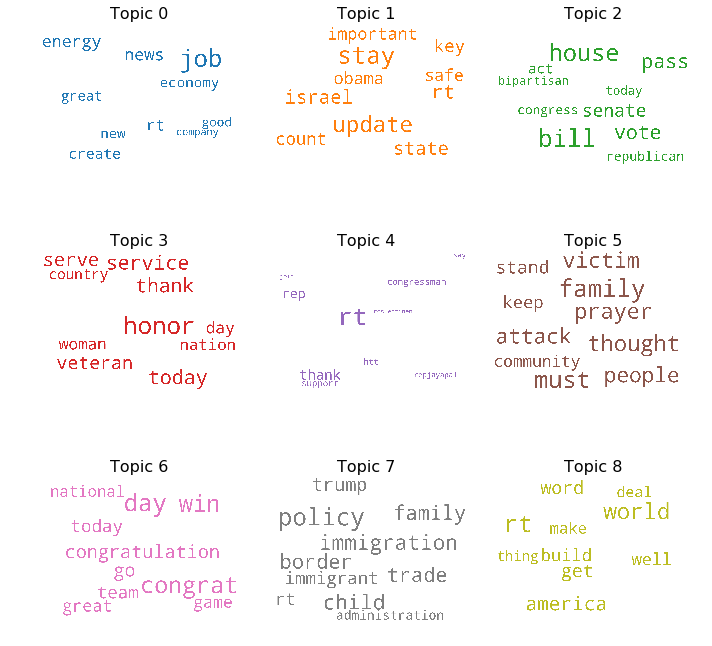

In [201]:
topic_wordcloud(top_model)

In [223]:
topic_sne(top_model,sample_corpus)

Loading BokehJS ...